In [1]:
import sys
import os
import numpy as np
import pandas as pd
import numpy.matlib
import matplotlib.pyplot as plt
%matplotlib inline
# mcfly
# from mcfly import modelgen, find_architecture, storage
from keras.models import load_model
np.random.seed(7)

Using TensorFlow backend.


In [11]:
# import plotly.offline as py
# import plotly.graph_objs as go
# py.init_notebook_mode()
from pathlib import Path
import scipy.io as sio
from skimage import data
from skimage.transform import resize
from keras.preprocessing import image
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()

In [3]:
def Make_recurrence_plot(s_input, m, tau):
    ''' need extra modification, the variable name is not self-explanatory
    s_input  (time series (HW where H is one, W is the data length)) is a vector, ndim = 1., but here it required shape of (-1,) (python style) to work, might need to modify to take array
    S is the reconstructed phase space plot
    S1, shape of (N2*N2,m), is a matrix consists of a group of different N2 points that get repeated N2 times [N2 different points], then repeat the group for N2 times
    S2, shape of (N2*N2,m), is a matrix consists of N2 no. of groups that have N2 no of same points within the group [N2 x same points], then repeat for N2 different point
    ref:
        http://www.agnld.uni-potsdam.de/~marwan/matlab-tutorials/html/rp.html#13
        Return:
            [N2, N2]
    '''
    if np.squeeze(s_input).ndim != 1:
        raise ValueError('object too deep for desired array')
    s_input = s_input.reshape(-1)
    N = s_input.size
    #print("N is {}".format(N))
    N2 = s_input.size - tau * (m - 1)
    S = np.zeros((N2, m))
    #print("N2 is {}".format(N2))
    for state in range(m):  # arithemetic for zero based is a + nd
        S[:, state] = s_input[tau * state:N2 + tau * state]

    S1 = np.tile(S, (N2, 1))
    #print(S1.shape)
    S2 = np.repeat(S.T, N2).reshape(m, N2 * N2).T
    #print(S2.shape)
    distance_matrix = np.sqrt(np.sum((S1 - S2) ** 2, keepdims=True, axis=1)).reshape(N2, N2)

    return distance_matrix

In [4]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
def Recurrence_transform(data_set):

    Recurrence_plot_0 = resize(Make_recurrence_plot(data_set[0,:,0],m=4, tau=86), (256,256)).reshape(1,256,256)
    for i in np.arange(data_set.shape[0]-1):
        Recurrence_plot_0 = np.concatenate((Recurrence_plot_0,resize(Make_recurrence_plot(data_set[i+1,:,0],m=4, tau=86), (256,256)).reshape(1,256,256)),axis=0)
    
    Recurrence_plot_1 = resize(Make_recurrence_plot(data_set[0,:,1],m=5, tau=58), (256,256)).reshape(1,256,256)
    for i in np.arange(data_set.shape[0]-1):
        Recurrence_plot_1 = np.concatenate((Recurrence_plot_1,resize(Make_recurrence_plot(data_set[i+1,:,0],m=5, tau=58), (256,256)).reshape(1,256,256)),axis=0)
    
    Recurrence_plot_rescaled_0 = scaler_0.transform(Recurrence_plot_0.reshape(-1,1)).reshape(30,256,256)
    Recurrence_plot_rescaled_1 = scaler_1.transform(Recurrence_plot_1.reshape(-1,1)).reshape(30,256,256)
    
    Recurrence_plot = np.stack((Recurrence_plot_rescaled_0,Recurrence_plot_rescaled_1),axis=-1)
       
    
    print(Recurrence_plot.shape)
    return Recurrence_plot

In [5]:
# data_folder = Path('F:/Work&Publications/Paper 2/90-450Data(New)')
# X_train = np.load('X_train.npy')
X_train = np.load('X_train_new.npy')
Y_train = np.load('Y_train_diffused.npy')

In [6]:
print('x shape:', X_train.shape)
print('y shape:', Y_train.shape)

x shape: (390, 1000, 2)
y shape: (390, 13)


In [7]:
X_train.shape

(390, 1000, 2)

## Compute the <span style='color: green'> Tau </span> for *Closing* and *Opening* channels

In [32]:
a = np.correlate(X_train[150,:,1].reshape(-1),X_train[150,:,1].reshape(-1), mode='full')
# np.save('Auto_correlation of channel_1',a)
py.iplot([go.Scatter(x=np.linspace(0,2000,2000), y=a, name='Auto_correlate')])

In [33]:
b = np.correlate(X_train[150,:,0].reshape(-1),X_train[150,:,0].reshape(-1), mode='full')
# np.save('Auto_correlation of channel_0',b)
py.iplot([go.Scatter(x=np.linspace(0,2000,2000), y=b, name='Auto_correlate')])

In [37]:
sio.savemat('RAW_Aoto_correlation signals.mat',{
            'correlation_channel_0':X_train[150,:,0],
            'correlation_channel_1':X_train[270,:,1],
#             'pred_from_390':predictions_c,
#             'validation_360_1':Val_Y_1,
#             'validation_360_2':Val_Y_2,
})

In [35]:
import scipy.io as sio
sio.savemat('Aoto_correlation signals.mat',{
            'correlation_channel_0':b,
            'correlation_channel_1':a,
#             'pred_from_390':predictions_c,
#             'validation_360_1':Val_Y_1,
#             'validation_360_2':Val_Y_2,
})

### <span style='color: green'> Tau </span> for channel [0] is 85, <span style='color: green'> Tau </span> for channel [1] is 55 (computed using autocorrelation)

### <span style='color: red'> m </span> for channel [0] is 4, <span style='color: red'> m </span> for channel [1] is 5 (found using False Nearst Neighbours)

## Recurrence plot

In [8]:
def recurrence_plot(s_input, m, tau):
    ''' need extra modification, the variable name is not self-explanatory
    s_input  (time series (HW where H is one, W is the data length)) is a vector, ndim = 1., but here it required shape of (-1,) (python style) to work, might need to modify to take array
    S is the reconstructed phase space plot
    S1, shape of (N2*N2,m), is a matrix consists of a group of different N2 points that get repeated N2 times [N2 different points], then repeat the group for N2 times
    S2, shape of (N2*N2,m), is a matrix consists of N2 no. of groups that have N2 no of same points within the group [N2 x same points], then repeat for N2 different point
    ref:
        http://www.agnld.uni-potsdam.de/~marwan/matlab-tutorials/html/rp.html#13
        Return:
            [N2, N2]
    '''
    if np.squeeze(s_input).ndim != 1:
        raise ValueError('object too deep for desired array')
    s_input = s_input.reshape(-1)
    N = s_input.size
    #print("N is {}".format(N))
    N2 = s_input.size - tau * (m - 1)
    S = np.zeros((N2, m))
    #print("N2 is {}".format(N2))
    for state in range(m):  # arithemetic for zero based is a + nd
        S[:, state] = s_input[tau * state:N2 + tau * state]

    S1 = np.tile(S, (N2, 1))
    #print(S1.shape)
    S2 = np.repeat(S.T, N2).reshape(m, N2 * N2).T
    #print(S2.shape)
    distance_matrix = np.sqrt(np.sum((S1 - S2) ** 2, keepdims=True, axis=1)).reshape(N2, N2)

    return distance_matrix

## Conversion to *Recurence Plot* for Column_0
### <span style='color: green'> Tau </span> for channel [0] is 86，<span style='color: red'>m </span> for channel [0] is 4

In [9]:
import timeit

In [13]:
timeit.timeit('"-".join(str(n) for n in range(100))', number=10000)

0.2402387948069702

In [12]:
timeit.timeit('recurrence_plot_0 = resize(Make_recurrence_plot(X_train[0,:,0],m=4, tau=86), (256,256)).reshape(1,256,256)', number=20)

NameError: name 'resize' is not defined

In [19]:
%%timeit -r 100 -c
recurrence_plot_0 = resize(Make_recurrence_plot(X_train[0,:,0],m=4, tau=86), (256,256)).reshape(1,256,256)

75.7 ms ± 831 µs per loop (mean ± std. dev. of 100 runs, 10 loops each)


In [14]:
recurrence_plot_0 = resize(Make_recurrence_plot(X_train[0,:,0],m=4, tau=86), (256,256)).reshape(1,256,256)
for i in np.arange(X_train.shape[0]-1):
    recurrence_plot_0 = np.concatenate((recurrence_plot_0,resize(Make_recurrence_plot(X_train[i+1,:,0],m=4, tau=86), (256,256)).reshape(1,256,256)),axis=0)

C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\skimage\transform\_warps.py:105: UserWarning:

The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.

C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\skimage\transform\_warps.py:110: UserWarning:

Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.



In [9]:
recurrence_plot_0.shape

(390, 256, 256)

## Conversion to *Recurence Plot* for Column_1
### <span style='color: green'> Tau </span> for channel [1] is 58,  <span style='color: red'> m </span> for channel [1] is 5

In [10]:
recurrence_plot_1 = resize(Make_recurrence_plot(X_train[0,:,1],m=5, tau=58), (256,256)).reshape(1,256,256)
for i in np.arange(X_train.shape[0]-1):
    recurrence_plot_1 = np.concatenate((recurrence_plot_1,resize(Make_recurrence_plot(X_train[i+1,:,0],m=5, tau=58), (256,256)).reshape(1,256,256)),axis=0)

In [11]:
recurrence_plot_1.shape

(390, 256, 256)

In [96]:
recurrence_plot = np.stack((recurrence_plot_0,recurrence_plot_1),axis=-1)
recurrence_plot.shape

(390, 256, 256, 2)

In [ ]:
np.save('train_recurrence_plot',recurrence_plot)

## Rescale the np array

In [12]:
from sklearn.preprocessing import StandardScaler

scaler_0 = StandardScaler()
scaler_1 = StandardScaler()

scaler_0.fit(recurrence_plot_0.reshape(-1,1))
scaler_1.fit(recurrence_plot_1.reshape(-1,1))


StandardScaler(copy=True, with_mean=True, with_std=True)

In [13]:
scaler = StandardScaler()

recurrence_plot_rescaled_0 = scaler.fit_transform(recurrence_plot_0.reshape(-1,1)).reshape(390,256,256)
recurrence_plot_rescaled_1 = scaler.fit_transform(recurrence_plot_1.reshape(-1,1)).reshape(390,256,256)
recurrence_plot_rescaled = np.stack((recurrence_plot_rescaled_0,recurrence_plot_rescaled_1),axis=-1)
recurrence_plot_rescaled.shape

(390, 256, 256, 2)

In [ ]:
np.save('train_recurrence_plot_rescaled',recurrence_plot_rescaled)

In [3]:
recurrence_plot_rescaled = np.load('train_recurrence_plot_rescaled.npy')

In [4]:
recurrence_plot_rescaled.shape

(390, 256, 256, 2)

In [39]:
recurrence_plot_rescaled[:,:,:,0].min()

-1.7945320713364974

In [40]:
recurrence_plot_rescaled[:,:,:,0].max()

5.001839499148093

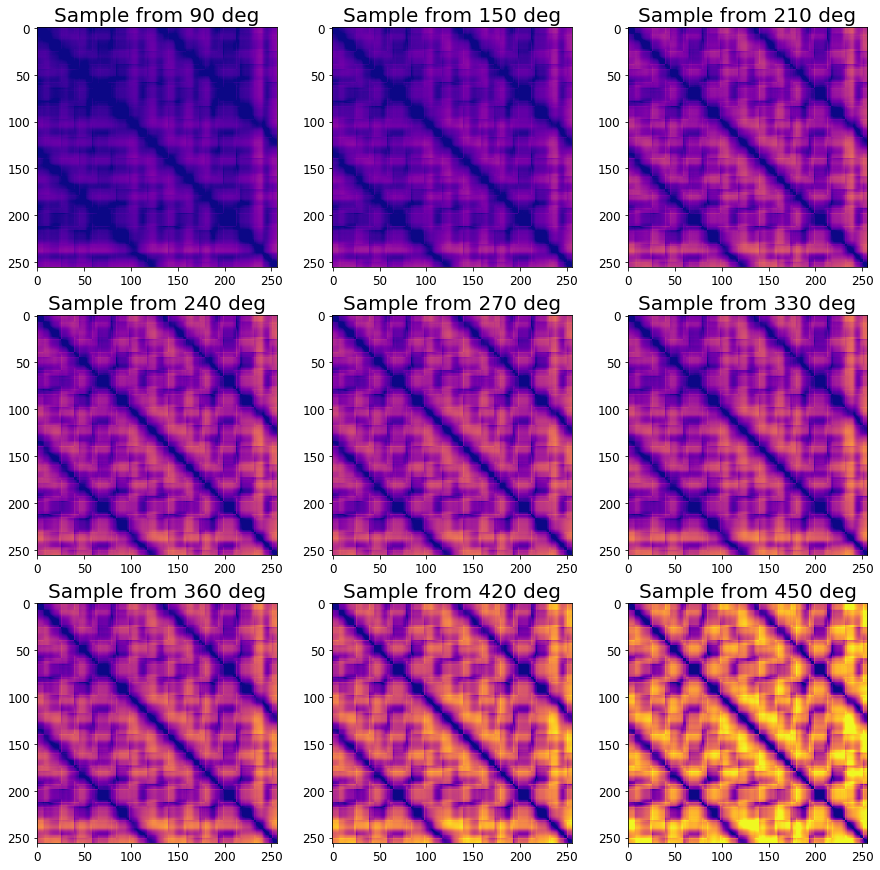

In [57]:
fig1 = plt.figure(figsize=[15,15])
for i,num in enumerate([0,2,4,5,6,8,9,11,12]):    
    plt.subplot(3,3,(i+1))
    plt.imshow(recurrence_plot_rescaled[7+num*30,:,:,1],
               vmin=-1.5,vmax=3.5,
               cmap=plt.get_cmap('plasma')
              )
#     plt.colorbar()
    plt.title('Sample from %i deg'%(90+num*30), fontsize = 20)
    plt.tick_params(labelsize=12)
fig1.savefig('9RPs_channel_1.png')

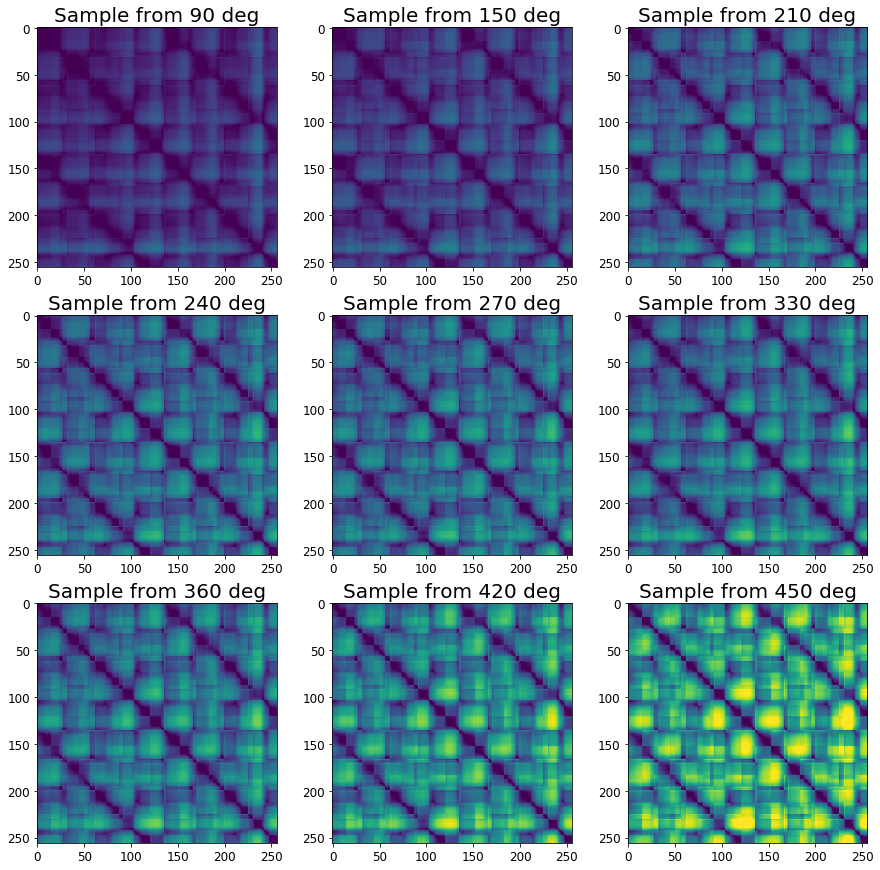

In [56]:
fig2 = plt.figure(figsize=[15,15])
for i,num in enumerate([0,2,4,5,6,8,9,11,12]):    
    plt.subplot(3,3,(i+1))
    plt.imshow(recurrence_plot_rescaled[7+num*30,:,:,0],
               vmin=-1.5,vmax=3.8,
               cmap=plt.get_cmap('viridis')
              )
#     plt.colorbar()
    plt.title('Sample from %i deg'%(90+num*30), fontsize = 20)
    plt.tick_params(labelsize=12)
fig2.savefig('9RPs_channel_0.png')

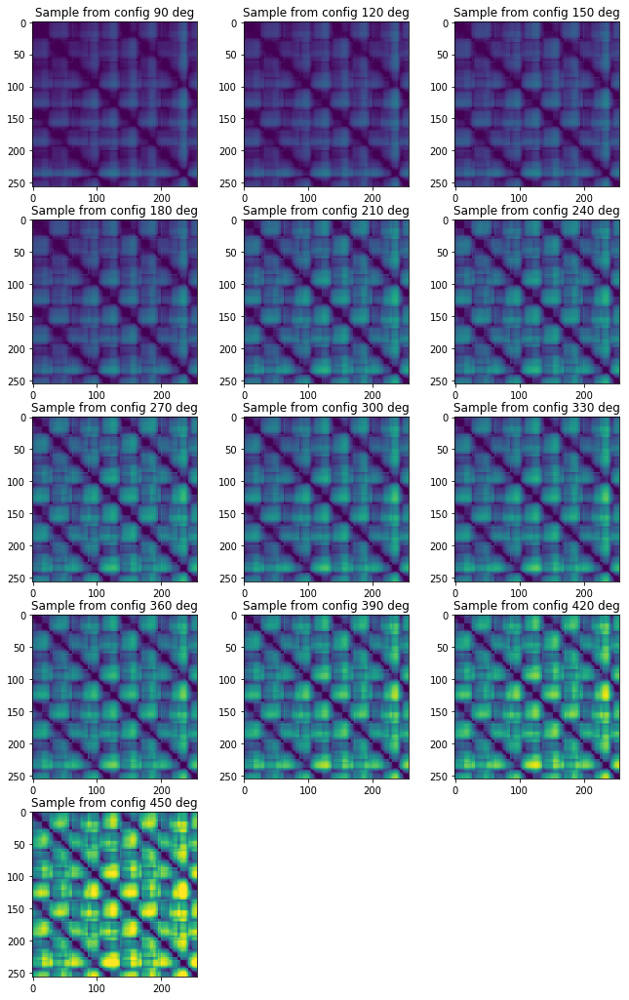

In [15]:
fig2 = plt.figure(figsize=[11,18])
for i in np.arange(13):    
    plt.subplot(5,3,(i+1))
    plt.imshow(recurrence_plot_rescaled[6+i*30,:,:,0],
               vmin=-1.5,vmax=3.8,
               cmap=plt.get_cmap('viridis')
              )
#     plt.colorbar()
    plt.title('Sample from config %i deg'%(90+i*30))
fig2.savefig('13RPs_channel_0.png')

In [6]:
recurrence_plot_rescaled_1.min()

NameError: name 'recurrence_plot_rescaled_1' is not defined

In [22]:
recurrence_plot_rescaled_1.max()

3.524084124832534

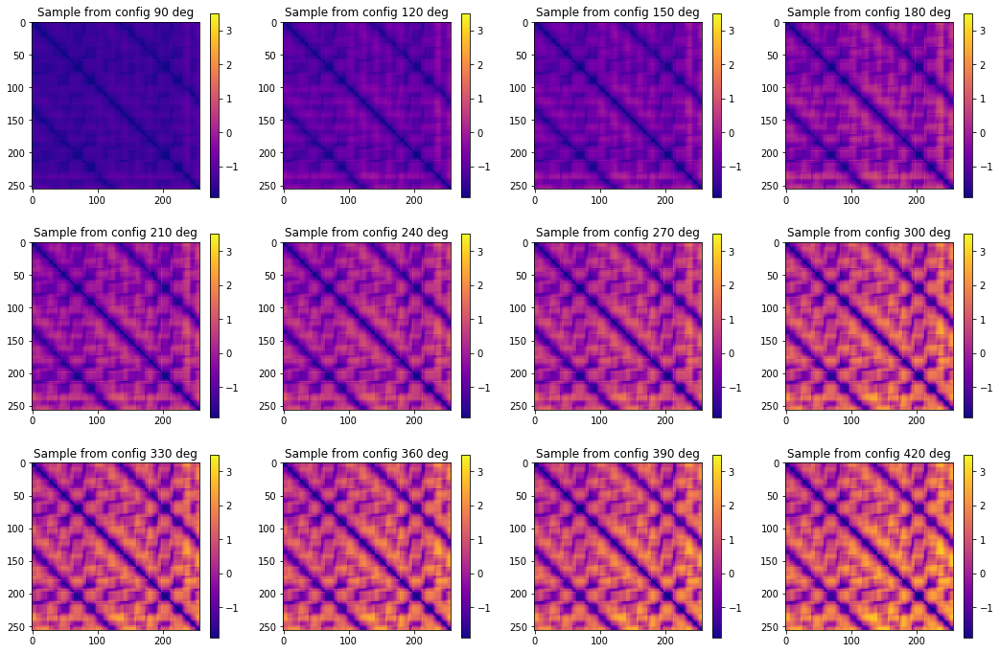

In [23]:
plt.figure(figsize=[18,12])
for i in np.arange(12):    
    plt.subplot(3,4,(i+1))
    plt.imshow(recurrence_plot_rescaled_1[5+i*30,:,:],
               vmin=-1.9,vmax=3.5,
               cmap=plt.get_cmap('plasma')
              )
    plt.colorbar()
    plt.title('Sample from config %i deg'%(90+i*30))

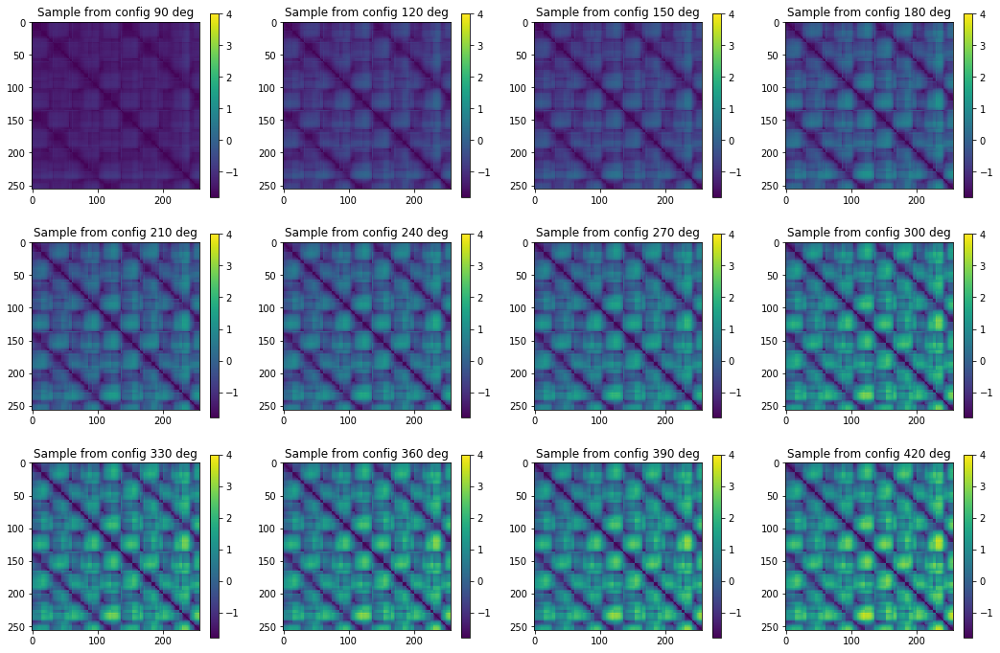

In [24]:
plt.figure(figsize=[18,12])
for i in np.arange(12):    
    plt.subplot(3,4,(i+1))
    plt.imshow(recurrence_plot_rescaled_0[5+i*30,:,:],
               vmin=-1.8,vmax=4,
               cmap=plt.get_cmap('viridis')
              )
    plt.colorbar()
    plt.title('Sample from config %i deg'%(90+i*30))

In [17]:
demo = recurrence_plot_0[370,:,:]
demo_2 = recurrence_plot_1[370,:,:]

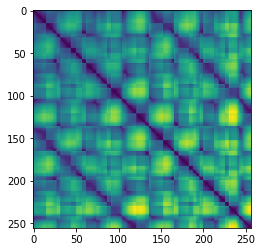

In [16]:
fig = plt.figure()
plt.imshow(demo,
#                vmin=-1.8,vmax=4,
               cmap=plt.get_cmap('viridis')
              )

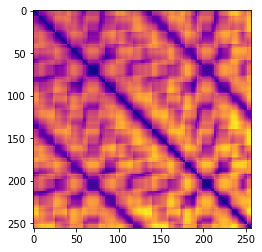

In [19]:
fig_2 = plt.figure()
plt.imshow(demo_2,
#             vmin=-1.9,vmax=3.5,
            cmap=plt.get_cmap('plasma')
              )

In [20]:
fig.savefig('demo_RP.png')
fig_2.savefig('demo_2_RP.png')

In [22]:
def plot_figure(data, filename='dist_mat', threshold=None):
    # data.shape = (H,W)
    if threshold:
        data /= np.max(data)
        data[data >= threshold] = 1
        data[data < threshold] = 0
#     data = data *(-1)
    fig = plt.figure()
    plt.imshow(data, cmap=plt.get_cmap('gray'))
    fig.savefig('dist_mat_2.png')
  

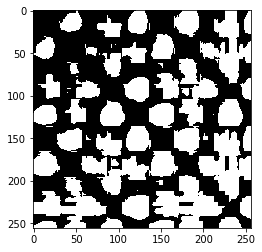

In [127]:
plot_figure(demo,threshold=0.5)

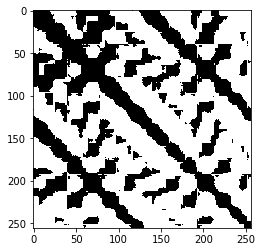

In [23]:
plot_figure(demo_2,threshold=0.5)

In [29]:
X_train[370,:,0].reshape(1000,1).shape

(1000, 1)

In [30]:
import scipy.io as sio
sio.savemat('Two_RP_signals_for_plotting.mat',{
            'channel_0':X_train[370,:,0].reshape(1000,1),
            'channel_1':X_train[370,:,1].reshape(1000,1),
#             'pred_from_390':predictions_c,
#             'validation_360_1':Val_Y_1,
#             'validation_360_2':Val_Y_2,
})

In [26]:
py.iplot([go.Scatter(x=np.linspace(0,10,1000), y=X_train[370,:,0], name='channel_0'),
          go.Scatter(x=np.linspace(0,10,1000), y=X_train[370,:,1], name='channel_1')
         ])

In [24]:
recurrence_plot.shape

(390, 256, 256, 2)

In [25]:
Y_train.shape

(390, 13)

In [36]:
from keras.applications.resnet50 import ResNet50
from keras.applications.resnet50 import decode_predictions
from keras.applications.resnet50 import preprocess_input
from keras import layers
from keras.models import Model
from keras.optimizers import Adam

In [4]:
base_model = ResNet50(weights=None, include_top=False , input_shape= (512,512,2))

Instructions for updating:
Colocations handled automatically by placer.


C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\keras_applications\imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 2 input channels.
  str(input_shape[-1]) + ' input channels.')
C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\keras_applications\resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


In [ ]:
base_model2 = ResNet50(weights=None, include_top=True, input_shape= (512,512,2), classes=13)

In [1]:
def make_custom_model():
    base_model = ResNet50(weights=None, include_top=False , input_shape= (512,512,2))
    x = base_model.output
    x = layers.GlobalAveragePooling2D(name='CustomLayer_1')(x)
    x = layers.Dense(name = 'CustomLayer_2', units=256, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    predictions = layers.Dense(name='CustomLayer_Output', units=13, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    
    opt = Adam(lr=0.0005, beta_1=0.9, beta_2=0.999, epsilon=1e-08)

    model.compile(optimizer=opt,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model
model = make_custom_model()

model.summary()

NameError: name 'ResNet50' is not defined

In [ ]:
base_model2.summary()

In [ ]:
from keras.optimizers import Adam
opt = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08)

model.compile(optimizer=opt,
              loss='categorical_crossentropy',
              metrics=['accuracy'])
# base_model2.compile(optimizer=opt,
#                   loss='categorical_crossentropy',
#                   metrics=['accuracy'])

In [6]:
recurrence_plot_rescaled = np.load('train_recurrence_plot_rescaled.npy')
Y_train = np.load('Y_train.npy')

In [ ]:
from sklearn.model_selection import train_test_split

# RP_train, RP_test, Target_train, Target_test = train_test_split(recurrence_plot,Y_train, test_size=0.2, random_state=7)
RP_rescale_train, RP_rescale_test, Target_rescale_train, Target_rescale_test = train_test_split(recurrence_plot_rescaled,Y_train, test_size=0.2, random_state=7)

In [18]:
from sklearn.model_selection import KFold, StratifiedKFold

In [30]:
K_folds = KFold(n_splits=5,shuffle=False, random_state=7)
K_folds_Stratified = StratifiedKFold(n_splits=5,shuffle=True, random_state=7)

In [ ]:
train_datagen = image.ImageDataGenerator()
batch_size = 8
train_generator = train_datagen.flow(x=recurrence_plot_rescaled,
                                     y=Y_train,
                                     batch_size=batch_size,
#                                      class_mode='categorical'
                  )

In [9]:
from utils import plot_training_summary
from utils import TimeSummary
from utils import save_keras_dataset_to_disk

In [24]:
Y_train_one_col = np.zeros((260,1))
for i in np.arange(13):
    Y_train_one_col[i*20:i*20+20,0] = int(i)
Y_train_one_col.astype(int);

In [26]:
Y_train_one_col.shape

(260, 1)

# Cross_Validation with 5-Folds

In [37]:
time_summary = TimeSummary()
cvscores = []
for j, (train_idx, val_idx) in enumerate(K_folds_Stratified.split(recurrence_plot_rescaled, y=Y_train_one_col)):
    print('\nFold:', j+1)
    X_train_cv = recurrence_plot_rescaled[train_idx]
    y_train_cv = Y_train[train_idx]
    X_valid_cv = recurrence_plot_rescaled[val_idx]
    y_valid_cv= Y_train[val_idx]
    
    model = make_custom_model()
    summary = model.fit(x=X_train_cv,
                      y=y_train_cv,
                      batch_size = 5,
                      epochs = 800,
                      verbose = 1,
                      callbacks = [time_summary],
                      validation_data=(X_valid_cv,y_valid_cv),
        #               max_queue_size = 10    
            )
    scores = model.evaluate(X_valid_cv, y_valid_cv, verbose = 0)
    cvscores.append(scores[1]*100)
print('The CV-Accuracy is: {} with standard deviation of {}'.format(np.mean(cvscores), np.std(cvscores)))


Fold: 1


C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\keras_applications\imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 2 input channels.
  str(input_shape[-1]) + ' input channels.')
C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\keras_applications\resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


Train on 208 samples, validate on 52 samples
Epoch 1/800
208/208 [==============================] - 64s 306ms/step - loss: 4.7527 - acc: 0.1106 - val_loss: 4.1348 - val_acc: 0.1538
Epoch 2/800
208/208 [==============================] - 12s 56ms/step - loss: 3.1834 - acc: 0.1154 - val_loss: 7.6339 - val_acc: 0.2308
Epoch 3/800
208/208 [==============================] - 12s 56ms/step - loss: 2.5090 - acc: 0.1442 - val_loss: 2.1227 - val_acc: 0.2308
Epoch 4/800
208/208 [==============================] - 12s 56ms/step - loss: 2.4851 - acc: 0.1442 - val_loss: 2.0447 - val_acc: 0.2885
Epoch 5/800
208/208 [==============================] - 12s 56ms/step - loss: 2.3934 - acc: 0.1683 - val_loss: 2.0024 - val_acc: 0.2308
Epoch 6/800
208/208 [==============================] - 12s 56ms/step - loss: 2.3346 - acc: 0.1779 - val_loss: 2.0014 - val_acc: 0.3077
Epoch 7/800
208/208 [==============================] - 12s 56ms/step - loss: 2.3728 - acc: 0.1683 - val_loss: 1.9771 - val_acc: 0.3077
Epoch 8/8

Epoch 61/800
208/208 [==============================] - 12s 56ms/step - loss: 1.3687 - acc: 0.3894 - val_loss: 0.9149 - val_acc: 0.5000
Epoch 62/800
208/208 [==============================] - 12s 56ms/step - loss: 1.5543 - acc: 0.3125 - val_loss: 14.4383 - val_acc: 0.0769
Epoch 63/800
208/208 [==============================] - 12s 56ms/step - loss: 1.6669 - acc: 0.2500 - val_loss: 13.9046 - val_acc: 0.0769
Epoch 64/800
208/208 [==============================] - 12s 56ms/step - loss: 1.6276 - acc: 0.2981 - val_loss: 2.9727 - val_acc: 0.3077
Epoch 65/800
208/208 [==============================] - 12s 56ms/step - loss: 1.5490 - acc: 0.3654 - val_loss: 0.9736 - val_acc: 0.5577
Epoch 66/800
208/208 [==============================] - 12s 56ms/step - loss: 1.4877 - acc: 0.3317 - val_loss: 1.7765 - val_acc: 0.4423
Epoch 67/800
208/208 [==============================] - 12s 56ms/step - loss: 1.5503 - acc: 0.3269 - val_loss: 1.1649 - val_acc: 0.4423
Epoch 68/800
208/208 [========================

208/208 [==============================] - 12s 56ms/step - loss: 1.3262 - acc: 0.4663 - val_loss: 0.8134 - val_acc: 0.5962
Epoch 122/800
208/208 [==============================] - 12s 56ms/step - loss: 1.3402 - acc: 0.3654 - val_loss: 0.8266 - val_acc: 0.5769
Epoch 123/800
208/208 [==============================] - 12s 56ms/step - loss: 1.3093 - acc: 0.4471 - val_loss: 0.8717 - val_acc: 0.6923
Epoch 124/800
208/208 [==============================] - 12s 56ms/step - loss: 1.3139 - acc: 0.3798 - val_loss: 0.8306 - val_acc: 0.6346
Epoch 125/800
208/208 [==============================] - 12s 56ms/step - loss: 1.3140 - acc: 0.3702 - val_loss: 0.7451 - val_acc: 0.6923
Epoch 126/800
208/208 [==============================] - 12s 56ms/step - loss: 1.3346 - acc: 0.4519 - val_loss: 1.0876 - val_acc: 0.4615
Epoch 127/800
208/208 [==============================] - 12s 56ms/step - loss: 1.4222 - acc: 0.3990 - val_loss: 3.6373 - val_acc: 0.1538
Epoch 128/800
208/208 [==============================] 

Epoch 181/800
208/208 [==============================] - 12s 56ms/step - loss: 1.2996 - acc: 0.4038 - val_loss: 0.8506 - val_acc: 0.5385
Epoch 182/800
208/208 [==============================] - 12s 56ms/step - loss: 1.2827 - acc: 0.4038 - val_loss: 0.7466 - val_acc: 0.7500
Epoch 183/800
208/208 [==============================] - 12s 56ms/step - loss: 1.2894 - acc: 0.3942 - val_loss: 0.7307 - val_acc: 0.6731
Epoch 184/800
208/208 [==============================] - 12s 56ms/step - loss: 1.3439 - acc: 0.3510 - val_loss: 0.9637 - val_acc: 0.4615
Epoch 185/800
208/208 [==============================] - 12s 56ms/step - loss: 1.1887 - acc: 0.4808 - val_loss: 0.7356 - val_acc: 0.6154
Epoch 186/800
208/208 [==============================] - 12s 56ms/step - loss: 1.2001 - acc: 0.3990 - val_loss: 0.6915 - val_acc: 0.6346
Epoch 187/800
208/208 [==============================] - 12s 56ms/step - loss: 1.1465 - acc: 0.4471 - val_loss: 0.7171 - val_acc: 0.6154
Epoch 188/800
208/208 [==================

KeyboardInterrupt: 

In [29]:
cvscores

[65.38461561386401,
 84.61538553237915,
 84.61538415688736,
 94.23077014776376,
 100.0]

In [13]:
scores

[12.399260887732872, 0.23076923076923078]

In [ ]:
plot_training_summary(summary, time_summary)

## Train and validation with 80-20

In [ ]:
time_summary = TimeSummary()
summary = model.fit_generator(train_generator,
                                  epochs=300,
                                  steps_per_epoch=32,
                                  verbose=1,
                                  callbacks=[time_summary],
                                  validation_data=(RP_rescale_test,Target_rescale_test),
                                  max_queue_size=10
)

## Full traning with all data and deploy on test sets

In [ ]:
recurrence_plot_rescaled = np.load('train_recurrence_plot_rescaled.npy')
Y_train = np.load('Y_train.npy')

In [ ]:
train_datagen = image.ImageDataGenerator()
batch_size = 10
train_generator = train_datagen.flow(x=recurrence_plot_rescaled,
                                     y=Y_train,
                                     batch_size=batch_size,
#                                      class_mode='categorical'
                  )
time_summary = TimeSummary()
summary = model.fit_generator(train_generator,
                                  epochs=300,
                                  steps_per_epoch=26,
                                  verbose=1,
                                  callbacks=[time_summary],
#                                   validation_data=(RP_rescale_test,Target_rescale_test),
                                  max_queue_size=10
)

In [ ]:
model_json = model.to_json()
with open("model_300_epoch.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("model_300_epoch.h5")
print("Saved model to disk")

In [ ]:
# load json and create model
json_file = open('model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("model.h5")
print("Loaded model from disk")

In [32]:
plot_training_summary(summary, time_summary)

NameError: name 'summary' is not defined

In [26]:
test_160 = np.load('Test_160_Deg.npy')
test_230 = np.load('Test_230_Deg.npy')
test_315 = np.load('Test_315_Deg.npy')
test_405 = np.load('Test_405_Deg.npy')

In [27]:
test_160.shape

(30, 1000, 2)

In [28]:
test_160_recurrence = Recurrence_transform(test_160)
test_230_recurrence = Recurrence_transform(test_230)
test_315_recurrence = Recurrence_transform(test_315)
test_405_recurrence = Recurrence_transform(test_405)

C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\skimage\transform\_warps.py:105: UserWarning:

The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.

C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\skimage\transform\_warps.py:110: UserWarning:

Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.



(30, 256, 256, 2)


C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\skimage\transform\_warps.py:105: UserWarning:

The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.

C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\skimage\transform\_warps.py:110: UserWarning:

Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.



(30, 256, 256, 2)


C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\skimage\transform\_warps.py:105: UserWarning:

The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.

C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\skimage\transform\_warps.py:110: UserWarning:

Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.



(30, 256, 256, 2)


C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\skimage\transform\_warps.py:105: UserWarning:

The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.

C:\Users\Project\Anaconda3\envs\Sylar_ML\lib\site-packages\skimage\transform\_warps.py:110: UserWarning:

Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.



(30, 256, 256, 2)


In [29]:
np.save('test_160_recurrence_256Deg',test_160_recurrence)
np.save('test_230_recurrence_256Deg',test_230_recurrence)
np.save('test_315_recurrence_256Deg',test_315_recurrence)
np.save('test_405_recurrence_256Deg',test_405_recurrence)


In [ ]:
test_160_recurrence = np.load('test_160_recurrence.npy')
test_230_recurrence = np.load('test_230_recurrence.npy')
test_315_recurrence = np.load('test_315_recurrence.npy')
test_405_recurrence = np.load('test_405_recurrence.npy')

In [ ]:
test_160_result = model.predict(test_160_recurrence)
for i in np.arange(20):
    print(['90_Deg','120_Deg','150_Deg','180_Deg','210_Deg','240_Deg',
             '270_Deg','300_Deg','330_Deg','360_Deg','390_Deg','420_Deg','450_Deg',
             'Test_160_Deg','Test_230_Deg','Test_315_Deg','Test_405_Deg'
            ][np.argmax(test_160_result[i,:])], 'with probability of:', test_160_result[i,np.argmax(test_160_result[i,:])])

In [ ]:
test_230_result = model.predict(test_230_recurrence)
for i in np.arange(20):
    print(['90_Deg','120_Deg','150_Deg','180_Deg','210_Deg','240_Deg',
             '270_Deg','300_Deg','330_Deg','360_Deg','390_Deg','420_Deg','450_Deg',
             'Test_160_Deg','Test_230_Deg','Test_315_Deg','Test_405_Deg'
            ][np.argmax(test_230_result[i,:])], 'with probability of:', test_230_result[i,np.argmax(test_230_result[i,:])])

In [ ]:
test_315_result = model.predict(test_315_recurrence)
for i in np.arange(20):
    print(['90_Deg','120_Deg','150_Deg','180_Deg','210_Deg','240_Deg',
             '270_Deg','300_Deg','330_Deg','360_Deg','390_Deg','420_Deg','450_Deg',
             'Test_160_Deg','Test_230_Deg','Test_315_Deg','Test_405_Deg'
            ][np.argmax(test_315_result[i,:])], 'with probability of:', test_315_result[i,np.argmax(test_315_result[i,:])])

In [ ]:
test_405_result = model.predict(test_405_recurrence)
for i in np.arange(20):
    print(['90_Deg','120_Deg','150_Deg','180_Deg','210_Deg','240_Deg',
             '270_Deg','300_Deg','330_Deg','360_Deg','390_Deg','420_Deg','450_Deg',
             'Test_160_Deg','Test_230_Deg','Test_315_Deg','Test_405_Deg'
            ][np.argmax(test_405_result[i,:])], 'with probability of:', test_405_result[i,np.argmax(test_405_result[i,:])])

In [ ]:
time_summary = TimeSummary()
summary = model.fit_generator(train_generator,
                              epochs=500,
                              steps_per_epoch=32,
                              verbose=1,
                              callbacks=[time_summary],
                              validation_data=(RP_rescale_test,Target_rescale_test),
                              max_queue_size=10
)